__Inspect the spike rate and sliding window correlations in regards to the copter's position on the field. The position is marked on a map and the according spike rate or correlation value higlighted in a graph. With a slider the position and higlight can be moved.__

In [ ]:
%matplotlib notebook
# disable with %matplotlib inline

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.cm
import numpy as np
import matplotlib.image as Image
import ipywidgets as widgets
import scipy.ndimage
from matplotlib.gridspec import GridSpec
from ipywidgets import interact
from mpl_toolkits.axes_grid1 import make_axes_locatable

import bee_view_analyzer.Correlation as Correlation
import bee_view_analyzer.DataLoader as DataLoader
import bee_view_analyzer.Utils as Utils
import bee_view_analyzer.Visualizer as Visualizer

In [ ]:
FLIGHT_DAY_AUGUST = 0
FLIGHT_DAY_SEPTEMBER = 1

RES_SMALL = 0   # 0.01 seconds
RES_MEDIUM = 1  # 0.1  seconds
RES_HIGH = 2    # 1    second

# spike_rates[flight_day][spike_rate_resolution][flight_num][neuron][data]
spike_rates = [[[], [], []], [[], [], []]]

# camera_positions[flight_day][spike_rate_resolution][flight_num][data]
camera_positions = [[[], [], []], [[], [], []]]

def load_flight(flight_day, spike_rate_resolution, csv_path, spike_type_rows, start_frame, voltage_column):    
    spikes = []
    for spike_col in spike_type_rows:
        spikes.append(DataLoader.load_neuro_data(None, csv_path, spike_col, start_frame))
    
    spike_rates[flight_day][spike_rate_resolution].append(spikes)
    
    cam_pos = DataLoader.load_camera_positions(csv_path, voltage_column, start_frame)
    camera_positions[flight_day][spike_rate_resolution].append(cam_pos)


csv_path = Utils.get_path(["flights", "flight_2018_09_03#1"],
                          "030918_01_out_adc_synced.csv_spike_rates_0.01s_intervalls.csv")
load_flight(FLIGHT_DAY_SEPTEMBER, RES_SMALL, csv_path, [8], 6000, 9)

csv_path = Utils.get_path(["flights", "flight_2018_09_03#2"],
                          "030918_2_out_adc_synced.csv_spike_rates_0.01s_intervalls.csv")
load_flight(FLIGHT_DAY_SEPTEMBER, RES_SMALL, csv_path, [2], 6000, 3)

csv_path = Utils.get_path(["flights", "flight_2018_09_03#3"],
                          "030918_3_out_adc_synced.csv_spike_rates_0.01s_intervalls.csv")
load_flight(FLIGHT_DAY_SEPTEMBER, RES_SMALL, csv_path, [2], 6000, 3)

csv_path = Utils.get_path(["flights", "flight_2018_09_03#4"],
                          "030918_4_out_adc_synced.csv_spike_rates_0.01s_intervalls.csv")
load_flight(FLIGHT_DAY_SEPTEMBER, RES_SMALL, csv_path, [2], 6000, 3)

csv_path = Utils.get_path(["flights", "flight_2018_08_02#1"],
                          "020818_out_adc_synced.csv.txt_spike_rates_0.01s_intervalls.csv")
load_flight(FLIGHT_DAY_AUGUST, RES_SMALL, csv_path, [2, 3, 4, 5, 6, 8, 9, 10, 11], 0, 12)

csv_path = Utils.get_path(["flights", "flight_2018_08_02#2"],
                          "020818_out_adc_synced.csv_spike_rates_0.01s_intervalls.csv")
load_flight(FLIGHT_DAY_AUGUST, RES_SMALL, csv_path, [2], 0, 3)


csv_path = Utils.get_path(["flights", "flight_2018_09_03#1"],
                          "030918_01_out_adc_synced.csv_spike_rates_0.1s_intervalls.csv")
load_flight(FLIGHT_DAY_SEPTEMBER, RES_MEDIUM, csv_path, [8], 600, 9)

csv_path = Utils.get_path(["flights", "flight_2018_09_03#2"],
                          "030918_2_out_adc_synced.csv_spike_rates_0.1s_intervalls.csv")
load_flight(FLIGHT_DAY_SEPTEMBER, RES_MEDIUM, csv_path, [2], 600, 3)

csv_path = Utils.get_path(["flights", "flight_2018_09_03#3"],
                          "030918_3_out_adc_synced.csv_spike_rates_0.1s_intervalls.csv")
load_flight(FLIGHT_DAY_SEPTEMBER, RES_MEDIUM, csv_path, [2], 600, 3)

csv_path = Utils.get_path(["flights", "flight_2018_09_03#4"],
                          "030918_4_out_adc_synced.csv_spike_rates_0.1s_intervalls.csv")
load_flight(FLIGHT_DAY_SEPTEMBER, RES_MEDIUM, csv_path, [2], 600, 3)

csv_path = Utils.get_path(["flights", "flight_2018_08_02#1"],
                          "020818_out_adc_synced.csv.txt_spike_rates_0.1s_intervalls.csv")
load_flight(FLIGHT_DAY_AUGUST, RES_MEDIUM, csv_path, [2, 3, 4, 5, 6, 8, 9, 10, 11], 0, 12)

csv_path = Utils.get_path(["flights", "flight_2018_08_02#2"],
                          "020818_out_adc_synced.csv_spike_rates_0.1s_intervalls.csv")
load_flight(FLIGHT_DAY_AUGUST, RES_MEDIUM, csv_path, [2], 0, 3)



csv_path = Utils.get_path(["flights", "flight_2018_09_03#1"],
                          "030918_01_out_adc_synced.csv_spike_rates_1.0s_intervalls.csv")
load_flight(FLIGHT_DAY_SEPTEMBER, RES_HIGH, csv_path, [8], 60, 9)

csv_path = Utils.get_path(["flights", "flight_2018_09_03#2"],
                          "030918_2_out_adc_synced.csv_spike_rates_1.0s_intervalls.csv")
load_flight(FLIGHT_DAY_SEPTEMBER, RES_HIGH, csv_path, [2], 60, 3)

csv_path = Utils.get_path(["flights", "flight_2018_09_03#3"],
                          "030918_3_out_adc_synced.csv_spike_rates_1.0s_intervalls.csv")
load_flight(FLIGHT_DAY_SEPTEMBER, RES_HIGH, csv_path, [2], 60, 3)

csv_path = Utils.get_path(["flights", "flight_2018_09_03#4"],
                          "030918_4_out_adc_synced.csv_spike_rates_1.0s_intervalls.csv")
load_flight(FLIGHT_DAY_SEPTEMBER, RES_HIGH, csv_path, [2], 60, 3)


# start_rounds[flight_day][flight_num][data]
start_rounds = [[[4230, 5850, 7430],
                [2130, 3730, 5300, 6940, 8575]],
                
                [[630, 2900, 4580],
                [743, 2390, 4070, 5770],
                [110, 1950, 3650, 5330],
                [330, 1980, 3650]]]      # exclude last round (flight route not finished, starts at 5330)

end_rounds = [[[5690, 7310, 8890],
              [3550, 5170, 6790, 8380, 10016]],
              
              [[2120, 4370, 6050],
              [2220, 3880, 5555, 7220],
              [1600, 3440, 5150, 6795],
              [1800, 3450, 5120]]]      # exclude last round (flight route not finished, ends at 6750)

In [ ]:
NEURON_DEFAULT = 0
NEURON_AUGUST_FLIGHT_1 = 2

def get_spike_rate(flight_day, spike_rate_resolution, flight_num):
    neuron_num = NEURON_DEFAULT
    
    if flight_day == FLIGHT_DAY_AUGUST and flight_num == 0:
        neuron_num = NEURON_AUGUST_FLIGHT_1
        
    
    return spike_rates[flight_day][spike_rate_resolution][flight_num][neuron_num]

def get_camera_positions(flight_day, spike_rate_resolution, flight_num):
    return camera_positions[flight_day][spike_rate_resolution][flight_num]

def get_start_round(spike_rate_resolution, flight_day, flight_num, round_num):
    return _get_round(start_rounds, spike_rate_resolution, flight_day, flight_num, round_num)
    
def get_end_round(spike_rate_resolution, flight_day, flight_num, round_num):
    return _get_round(end_rounds, spike_rate_resolution, flight_day, flight_num, round_num)

def _get_round(rounds_array, spike_rate_resolution, flight_day, flight_num, round_num):
    time = rounds_array[flight_day][flight_num][round_num]
    
    if type(time) == list:
        time = np.array(time)
                
    if spike_rate_resolution == RES_SMALL:
        time *= 10
    elif spike_rate_resolution == RES_HIGH:
        time //= 10
        
    return time

# Returns spike rate and camera positions without waiting frames between flight rounds.
# Start and end is not removed.
def get_data_wihout_waitings(flight_day, spike_rate_resolution, flight_num):
    spike_rate = get_spike_rate(flight_day, spike_rate_resolution, flight_num)
    
    try:
        camera_positions = get_camera_positions(flight_day, spike_rate_resolution, flight_num)
    except IndexError:
        camera_positions = None
    
    flight_start_rounds = []
    last_round_end = -1
    waiting_frames = 0
    camera_positions_without_waiting = None
    
    for round_num in range(len(start_rounds[flight_day][flight_num])):
        round_start = get_start_round(spike_rate_resolution, flight_day, flight_num, round_num)
        round_end = get_end_round(spike_rate_resolution, flight_day, flight_num, round_num)
        
        if round_num == 0:
            spike_rate_without_waiting = spike_rate[: round_end]
            
            if camera_positions is not None:
                camera_positions_without_waiting = camera_positions[: round_end]
        else:
            prev_round_end = get_end_round(spike_rate_resolution, flight_day, flight_num, round_num - 1)
            waiting_frames += round_start - prev_round_end   
            
            if round_num < len(start_rounds[flight_day][flight_num]) - 1:            
                spike_rate_without_waiting = np.append(spike_rate_without_waiting, spike_rate[round_start : round_end])
                
                if camera_positions is not None:
                    camera_positions_without_waiting = np.append(camera_positions_without_waiting, camera_positions[round_start : round_end], axis = 0)
            else:
                last_round_end = round_end - waiting_frames
                spike_rate_without_waiting = np.append(spike_rate_without_waiting, spike_rate[round_start : ])
                
                if camera_positions is not None:
                    camera_positions_without_waiting = np.append(camera_positions_without_waiting, camera_positions[round_start : ], axis = 0)
            
        
        flight_start_rounds.append(round_start - waiting_frames)
        
    return spike_rate_without_waiting, camera_positions_without_waiting, flight_start_rounds, last_round_end

def get_bin_data(time_series, bin_size, start = 0, end = -1, sum_bins = True):    
    if end == -1:
        end = len(time_series)
    
    bin_chunks = [time_series[x : x + bin_size] for x in range(start, end - (bin_size - 1), bin_size)]        
    
    if sum_bins:
        return np.sum(np.array(bin_chunks), 1)
    
    return bin_chunks

def get_scale_to_seconds(spike_rate_resolution):
    if spike_rate_resolution == RES_SMALL:
        return 100
    elif spike_rate_resolution == RES_MEDIUM:
        return 10
    else:
        return 1

def get_x_values_in_seconds(time_series, spike_rate_resolution, bin_size = -1):
    max_value = len(time_series)
    step = 1
    
    if bin_size > 0:
        max_value *= bin_size
        step *= bin_size
    
    scale = get_scale_to_seconds(spike_rate_resolution)
    
    max_value /= scale
    step /= scale
    
    return np.arange(0, max_value, step=step)

In [ ]:
# coordinated of two points on map image
a = np.array([612, 390])
b = np.array([378, 65])

img_distance = np.linalg.norm(a-b)
google_maps_meter_distance = 177.43 # distance between same points in meter (measured with google maps)

MAP_SCALE_FACTOR = img_distance / google_maps_meter_distance

MAP_ORIGIN_X = 488 # distance to leftmost x-coordinate from origin on field
MAP_ORIGIN_Y = 675 # distance to topmost y-coordinate from origin on field

def get_field_map(flight_day):
    if flight_day == FLIGHT_DAY_AUGUST:
        return Image.imread(Utils.get_path(['06_interactive_maps'], 'field_2018_08_02.png'))
    else:
        return Image.imread(Utils.get_path(['06_interactive_maps'], 'field_2018_09_03.png'))

In [ ]:
def show_interactive_map(flight_day, time_series, camera_positions, flight_start_rounds, bin_size = 1,
                         highlight = None, smoothness = 1, x_values=None, scale=1, colored=True):
           
    field_map = get_field_map(flight_day)
    arrow = Image.imread(Utils.get_path(['06_interactive_maps'], 'arrow.png'))

    fig = plt.figure(constrained_layout=True, figsize = (8,8), facecolor='white')

    rows = 3
    cols = 2
    gs = GridSpec(rows, cols, figure=fig)

    ax = fig.add_subplot(gs[0 : 2, :])
    ax.imshow(field_map)

    current_round = -1

    corr_overlay_img = None

    def update_round(progress):
        nonlocal current_round, corr_overlay_img

        # check which round should be shown (return if round did not change)

        next_round = 0

        for round_number in range(len(flight_start_rounds) - 1, -1, -1):
            if progress * bin_size >= flight_start_rounds[round_number]:
                next_round = round_number
                break

        if current_round == next_round:
            return

        current_round = next_round

        # draw time series (e.g. correlation values) at position of Neurocopter

        corr_overlay = np.full((field_map.shape[0], field_map.shape[1]), np.nan)
        corr_overlay[0,0] = 0

        end = len(camera_positions)
        
        if current_round + 1 < len(flight_start_rounds):
            end = flight_start_rounds[current_round + 1] 
            
        for frame_num in range(flight_start_rounds[current_round], end):
            # last round cannot be drawn completely
            if frame_num // bin_size >= len(time_series):
                break
            
            y = MAP_ORIGIN_Y - MAP_SCALE_FACTOR * int(camera_positions[frame_num][2])
            x = MAP_ORIGIN_X + MAP_SCALE_FACTOR * int(camera_positions[frame_num][0])
            
            color = time_series[frame_num // bin_size]
            if not colored:
                color = 1
            
            corr_overlay[int(y - MAP_SCALE_FACTOR) : int(y + MAP_SCALE_FACTOR),
                         int(x - MAP_SCALE_FACTOR) : int(x + MAP_SCALE_FACTOR)] = color

        # all unset (i.e. nan) values should be transparent
        current_cmap = matplotlib.cm.get_cmap()
        current_cmap.set_bad(alpha=0)

        divider = make_axes_locatable(ax)
        cax = divider.append_axes('right', size='5%', pad=0.05)

        if corr_overlay_img is None:
            corr_overlay_img = ax.imshow(corr_overlay, vmin=-0.2, vmax = 0.3)
        else:
            corr_overlay_img.set_data(corr_overlay)

        fig.colorbar(corr_overlay_img, cax=cax, orientation='vertical')


    overlay = None

    ax_graph = fig.add_subplot(gs[2, :])
    Visualizer.plot_ax(ax_graph, time_series, highlight_regions=highlight, smoothness = smoothness, x_values=x_values)

    def update_arrow_position(progress):
        nonlocal overlay, arrow
        
        overlay_arrow = np.full((field_map.shape[0], field_map.shape[1], 4), np.nan)

        # start point before progress
        y_start = int(MAP_ORIGIN_Y - MAP_SCALE_FACTOR * int(camera_positions[(progress * bin_size) - 10][2]))
        x_start = int(MAP_ORIGIN_X + MAP_SCALE_FACTOR * int(camera_positions[(progress * bin_size) - 10][0]))

        # end point after progress
        y_next = int(MAP_ORIGIN_Y - MAP_SCALE_FACTOR * int(camera_positions[(progress * bin_size) + 10][2]))
        x_next = int(MAP_ORIGIN_X + MAP_SCALE_FACTOR * int(camera_positions[(progress * bin_size) + 10][0]))

        # direction of current path
        y_dir = y_next - y_start
        x_dir = x_next - x_start

        # angle of orthogonal vector of direction vector to y-axis (= default position, arrow up)
        rotate_degrees = np.degrees(np.arctan2(y_dir, -x_dir))

        arrow_rot = scipy.ndimage.rotate(arrow, rotate_degrees)

        half_first_height = arrow_rot.shape[0] // 2
        half_second_height = arrow_rot.shape[0] - arrow_rot.shape[0] // 2

        half_first_width = arrow_rot.shape[1] // 2
        half_second_width = arrow_rot.shape[1] - arrow_rot.shape[1] // 2

        if rotate_degrees >= 135 or rotate_degrees <= -135:
            # arrow down
            overlay_arrow[y_start - arrow_rot.shape[0] : y_start,
                          x_start - half_first_width : x_start + half_second_width] = arrow_rot
            
        elif rotate_degrees > 45 and rotate_degrees < 135:
            # arrow left
            overlay_arrow[y_start - half_first_height : y_start + half_second_height,
                          x_start : x_start + arrow_rot.shape[1]] = arrow_rot
            
        elif rotate_degrees < -45 and rotate_degrees > -135:
            # arrow right
            overlay_arrow[y_start - half_first_height : y_start + half_second_height,
                          x_start - arrow_rot.shape[1] : x_start] = arrow_rot
            
        else:
            # arrow up
            overlay_arrow[y_start : y_start + arrow_rot.shape[0],
                          x_start - half_first_width : x_start + half_second_width] = arrow_rot

        if overlay is None:
            overlay = ax.imshow(overlay_arrow)
        else:
            overlay.set_data(overlay_arrow)

    graph_position = None

    def update_graph_position(progress):
        nonlocal graph_position

        scale_corr_index_to_seconds = bin_size // scale
        progress = progress * scale_corr_index_to_seconds
        
        if graph_position is not None:
            graph_position.remove()

        graph_position = ax_graph.axvspan(max(0, progress - 1),
                                          min(len(time_series) * scale_corr_index_to_seconds, progress + 1),
                                          color='red', alpha=0.2)

    def plot_progress(progress):        
        update_round(progress)
        update_arrow_position(progress)
        update_graph_position(progress)

        fig.canvas.draw_idle()

    slider = widgets.IntSlider(min=0, max=len(time_series), description='Frame',
                               layout=widgets.Layout(width='100%', height="50px"))
    
    interact(plot_progress, progress = slider)

# Show drone position on map

__This section shows the field with the copter's flight route and the recorded spike rate in separate plots. An arbitrary time point of the flight can be selected via a slider. The position of the copter at the chosen time frame is marked with an arrow on the map and is highlighted on the spike rate plot. Thus, it can be inspected where the copter was located at certain spike rate values.__

In [ ]:
def show_position_on_map(flight_day, spike_rate_resolution, flight_num):
           
    spike_rate = get_spike_rate(flight_day, spike_rate_resolution, flight_num)
    camera_positions = get_camera_positions(flight_day, spike_rate_resolution, flight_num)
    
    flight_start_rounds = [0]
    
    show_interactive_map(flight_day, spike_rate, camera_positions, flight_start_rounds, colored=False)

<IPython.core.display.Javascript object>


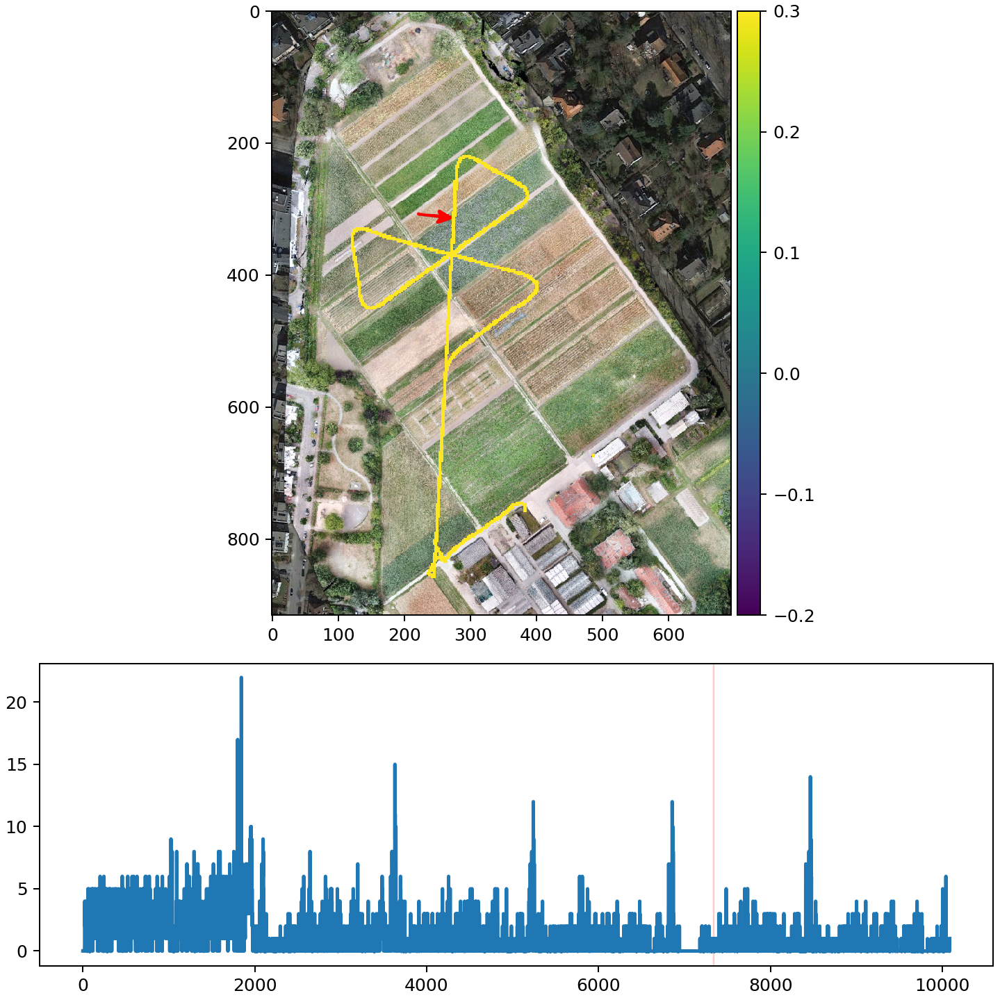

interactive(children=(IntSlider(value=0, description='Frame', layout=Layout(height='50px', width='100%'), max=…

In [ ]:
show_position_on_map(FLIGHT_DAY_AUGUST, RES_MEDIUM, flight_num = 1)

<IPython.core.display.Javascript object>


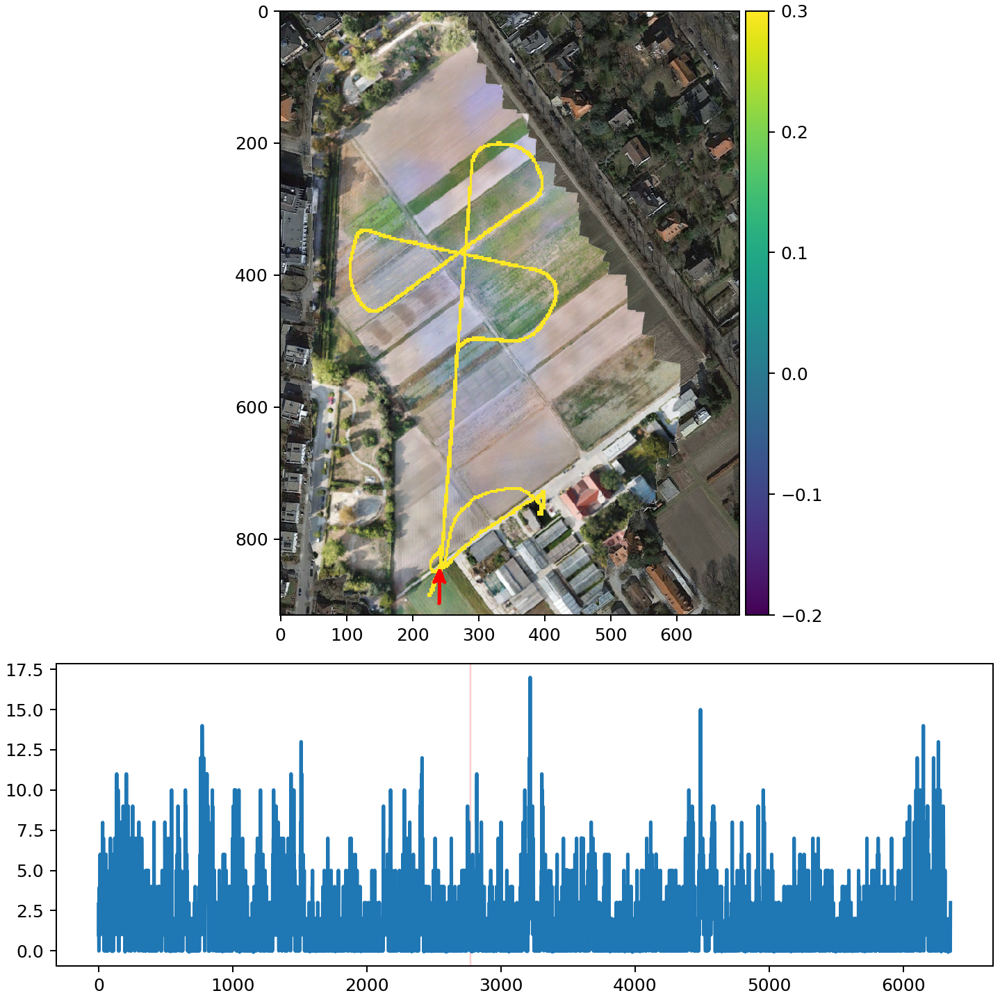

interactive(children=(IntSlider(value=0, description='Frame', layout=Layout(height='50px', width='100%'), max=…

In [ ]:
show_position_on_map(FLIGHT_DAY_SEPTEMBER, RES_MEDIUM, flight_num = 0)

# Sliding Window Correlation

__Similar as in section 1 but now with the result of a sliding window correlation (swc) instead of the spike rate. When the slider is moved to another flight round the swc values on the map along the flight trajectory are changed as well.__

In [ ]:
def interactive_swc_map(flight_day, spike_rate_resolution, flight_num, round_num, bin_size = 1, smoothness = 1):
    
    spike_rate, camera_positions, flight_start_rounds, last_round_end = get_data_wihout_waitings(flight_day,
                                                                                     spike_rate_resolution,
                                                                                     flight_num)
    
    bin_data = get_bin_data(spike_rate, bin_size)    
    start = flight_start_rounds[round_num]
    
    if round_num < len(flight_start_rounds) - 1:
        end = flight_start_rounds[round_num + 1]
    else:
        end = last_round_end

    corrs = Correlation.swc(bin_data, start // bin_size, end // bin_size)
    corrs = corrs[flight_start_rounds[0] // bin_size
                  : flight_start_rounds[len(flight_start_rounds) - 1] // bin_size]
    
    camera_positions = camera_positions[flight_start_rounds[0]
                                        : flight_start_rounds[len(flight_start_rounds) - 1]]

    margin = 1
    highlight = []
    scale = get_scale_to_seconds(spike_rate_resolution)
    first_round_start = flight_start_rounds[0]

    for start_round_index in range(len(flight_start_rounds)):
        start_round = flight_start_rounds[start_round_index] - first_round_start
        flight_start_rounds[start_round_index] = start_round
        
        highlight.append(((start_round) // scale) - margin)
        highlight.append(((start_round) // scale) + margin)
        
    x = [get_x_values_in_seconds(corrs, spike_rate_resolution, bin_size)]
    
    show_interactive_map(flight_day, corrs, camera_positions, flight_start_rounds, bin_size, highlight,
                         smoothness, x_values=x, scale=scale)

<IPython.core.display.Javascript object>


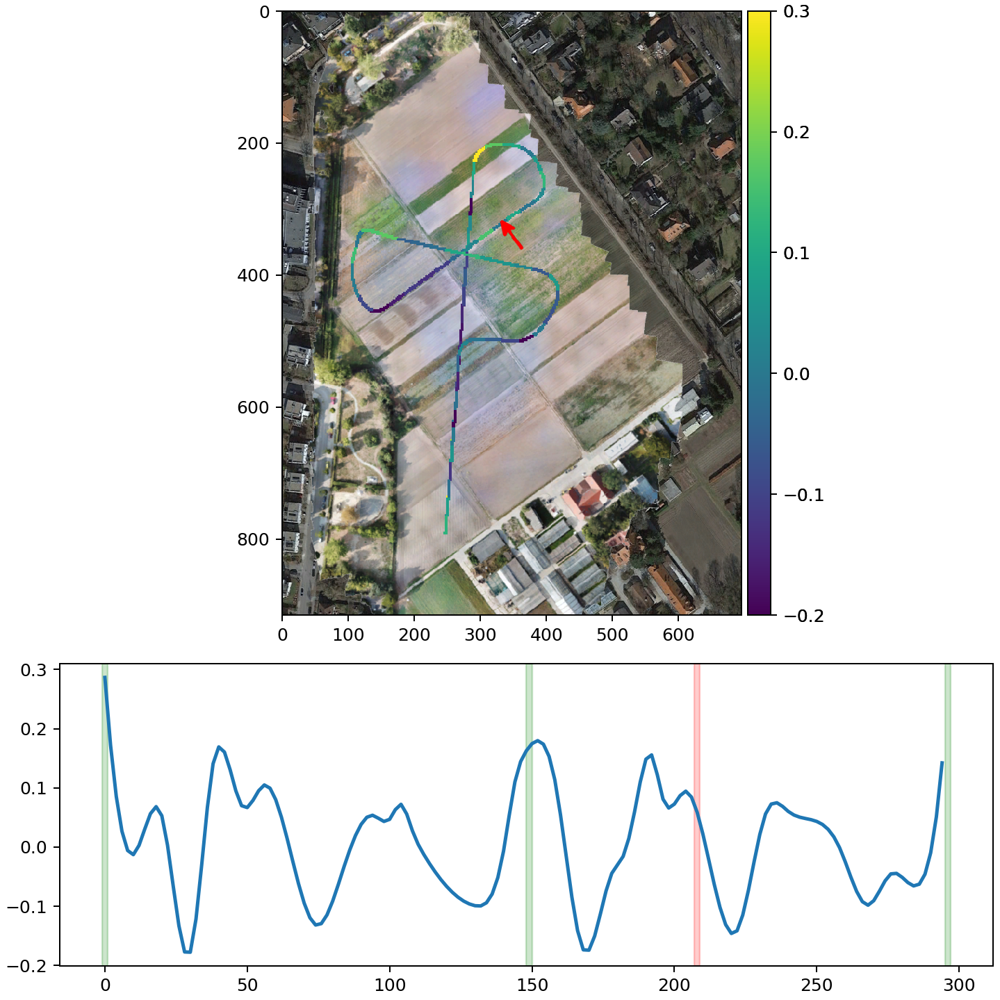

interactive(children=(IntSlider(value=0, description='Frame', layout=Layout(height='50px', width='100%'), max=…

In [ ]:
interactive_swc_map(FLIGHT_DAY_SEPTEMBER, RES_MEDIUM, flight_num=0, round_num=2, bin_size = 20)

<IPython.core.display.Javascript object>


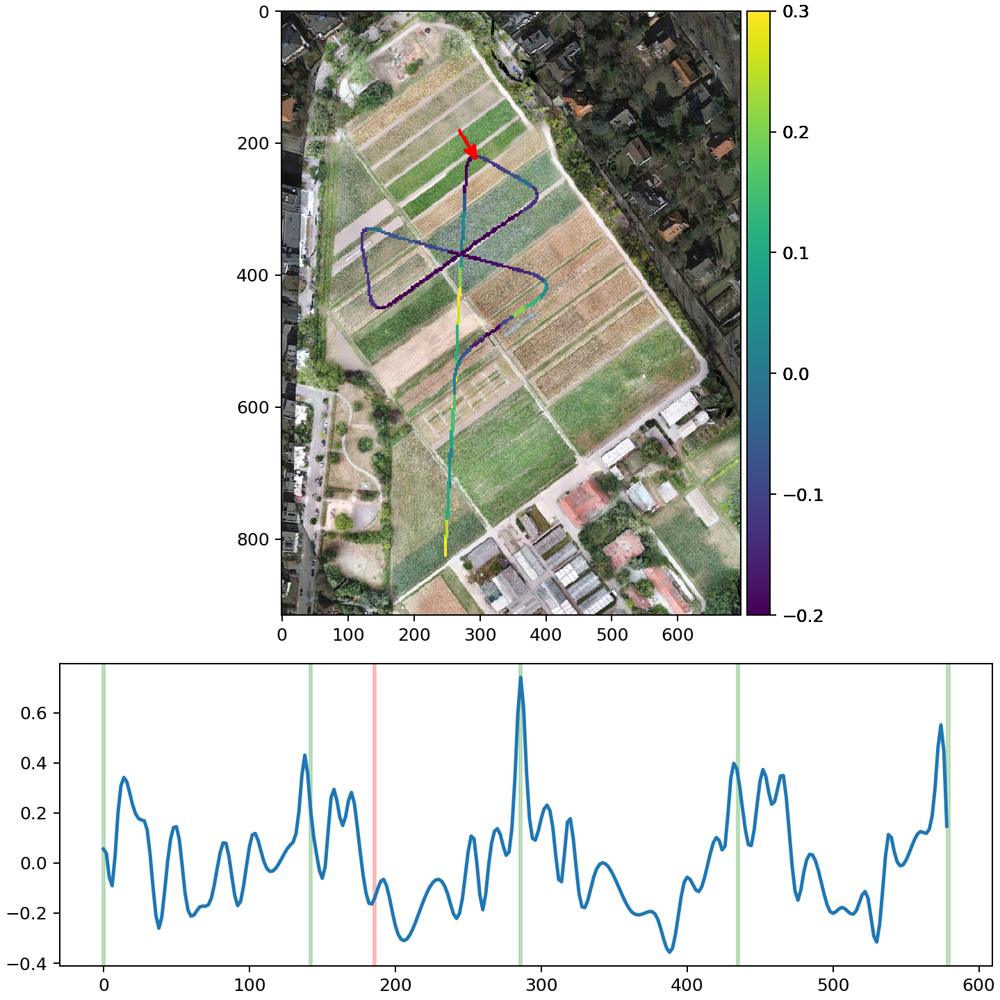

interactive(children=(IntSlider(value=0, description='Frame', layout=Layout(height='50px', width='100%'), max=…

In [ ]:
interactive_swc_map(FLIGHT_DAY_AUGUST, RES_MEDIUM, flight_num=1, round_num=2, bin_size = 20)

<IPython.core.display.Javascript object>


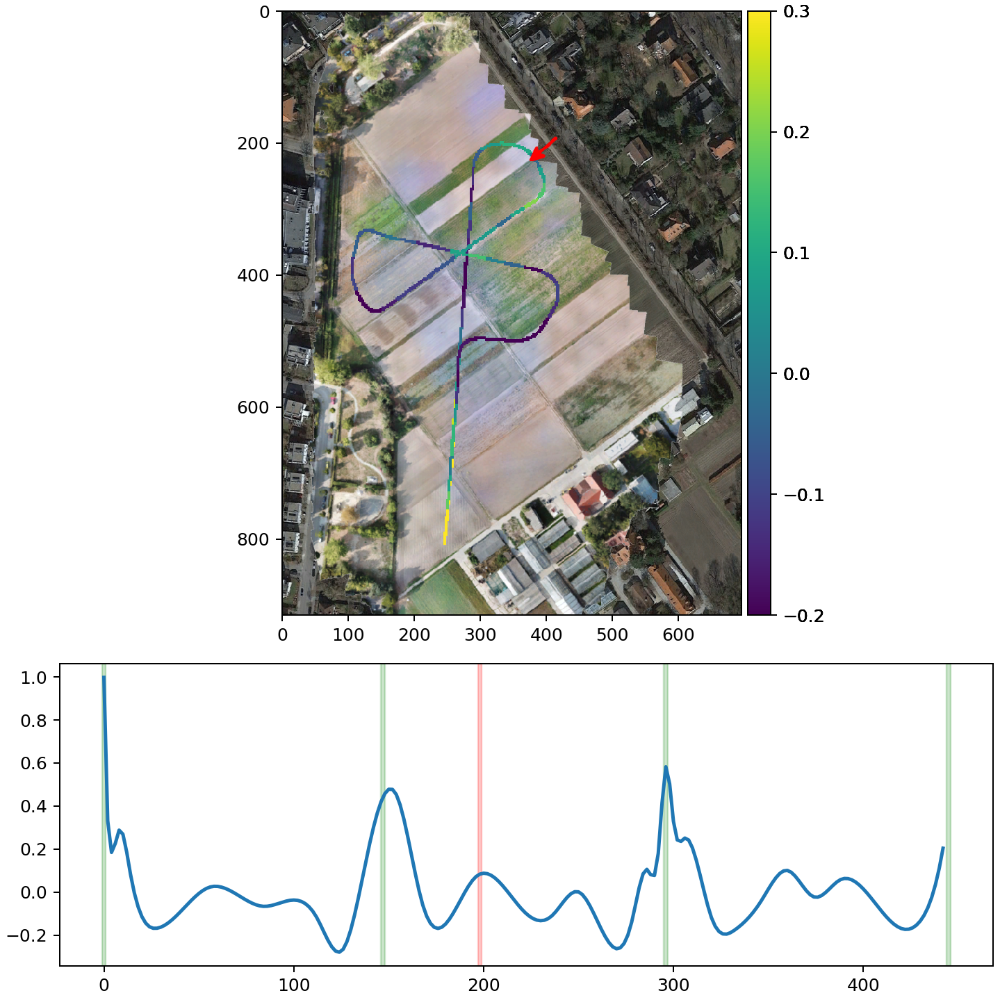

interactive(children=(IntSlider(value=0, description='Frame', layout=Layout(height='50px', width='100%'), max=…

In [ ]:
interactive_swc_map(FLIGHT_DAY_SEPTEMBER, RES_MEDIUM, flight_num=1, round_num=0, bin_size = 20)